## Install Dependencies

In [1]:
# %pip install --upgrade --quiet langchain-community langchain-openai langchain-experimental neo4j

In [2]:
%pip install pymupdf torch

In [3]:
!apt-get update
!apt-get install -y poppler-utils

Hit:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:3 http://security.ubuntu.com/ubuntu jammy-security InRelease
Hit:4 http://archive.ubuntu.com/ubuntu jammy InRelease
Hit:5 http://archive.ubuntu.com/ubuntu jammy-updates InRelease
Hit:6 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:7 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:8 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:9 https://r2u.stat.illinois.edu/ubuntu jammy InRelease
Hit:10 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Reading package lists... Done
W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Reading package lists... Done
Building dependency tree... Done
Reading

In [4]:
!apt-get install -y tesseract-ocr

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2.1build1).
0 upgraded, 0 newly installed, 0 to remove and 51 not upgraded.


In [5]:
%pip install pytesseract

In [6]:
%pip install nest_asyncio

## Import necessary packages

In [7]:
#document processing
import os
from typing import List, Dict
from pathlib import Path
import fitz  # PyMuPDF
from transformers import LayoutLMv3Processor, LayoutLMv3Model
from langchain.embeddings import OpenAIEmbeddings
from langchain.vectorstores import Neo4jVector
from langchain.chat_models import ChatOpenAI
from openai import AsyncOpenAI, OpenAI
import torch
from dataclasses import dataclass
from bs4 import BeautifulSoup
import pandas as pd

In [ ]:
# from neo4j import AsyncGraphDatabase
# from langchain.graphs import Neo4jGraph

In [8]:
import nest_asyncio
import asyncio
import os
from pathlib import Path
from typing import List, Dict, Tuple, Optional, DefaultDict
from tqdm import tqdm
import logging
import json
import gc
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

In [33]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Layout Analysis on lecture notes (pdf)

In [9]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

In [ ]:
from transformers import LayoutLMv3Processor, LayoutLMv3Model
import fitz  # PyMuPDF
import torch
from PIL import Image
import numpy as np
from typing import List, Dict, Tuple
import logging


In [83]:
class LayoutAnalyzer:
    def __init__(self):
        self.processor = LayoutLMv3Processor.from_pretrained(
            "microsoft/layoutlmv3-base",
            apply_ocr=True
        )
        device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.model = LayoutLMv3Model.from_pretrained("microsoft/layoutlmv3-base").to(device)
        self.device = device
        self.model.eval()

    async def process_page(self, pdf_page) -> Dict:
        """Process a single PDF page and extract layout information with enhanced error handling"""
        try:
            # Convert PDF page to image
            pix = pdf_page.get_pixmap(dpi=300)  # Set explicit DPI
            img = Image.frombytes("RGB", [pix.width, pix.height], pix.samples)

            # Process image through LayoutLMv3
            try:
                encoding = self.processor(
                    img,
                    return_tensors="pt",
                    truncation=True
                )
            except Exception as ocr_error:
                print(f"OCR Warning on page {pdf_page.number + 1}: {str(ocr_error)}")
                # Try to get text blocks even if OCR has warnings
                words = pdf_page.get_text("words")
                if words:
                    text_blocks = []
                    for word in words:
                        text_blocks.append({
                            "text": word[4],
                            "bbox": [word[0], word[1], word[2], word[3]],
                            "features": 0.5,  # Default feature value
                            "type": "text"    # Default type
                        })
                    return {
                        "page_number": pdf_page.number,
                        "blocks": text_blocks,
                        "layout_features": [0.5] * 768  # Default feature vector
                    }
                else:
                    raise Exception("No text could be extracted from page")

            # Move inputs to same device as model
            encoding = {k: v.to(self.device) for k, v in encoding.items()}

            # Get model outputs
            with torch.no_grad():
                outputs = self.model(**encoding)

            # Move outputs back to CPU for processing
            layout_features = outputs.last_hidden_state[0].cpu()

            # Extract text blocks with positions
            words = pdf_page.get_text("words")
            text_blocks = []

            for idx, word in enumerate(words):
                if idx < layout_features.shape[0]:  # Ensure we don't exceed features
                    # Classify block type based on features
                    feature_values = layout_features[idx].mean().item()
                    block_type = self._classify_block_type(feature_values)

                    text_blocks.append({
                        "text": word[4],
                        "bbox": [word[0], word[1], word[2], word[3]],
                        "features": feature_values,
                        "type": block_type
                    })

            return {
                "page_number": pdf_page.number,
                "blocks": text_blocks,
                "layout_features": layout_features.mean(dim=0).numpy().tolist()
            }

        except Exception as e:
            print(f"Error processing page {pdf_page.number + 1}: {str(e)}")
            # Return minimal valid structure even on error
            return {
                "page_number": pdf_page.number,
                "blocks": [],
                "layout_features": [],
                "error": str(e)
            }

    def _classify_block_type(self, feature_value: float) -> str:
        """Classify block type based on feature values"""
        if feature_value > 0.8:
            return "heading"
        elif feature_value > 0.6:
            return "subheading"
        elif feature_value > 0.4:
            return "list_item"
        elif feature_value > 0.2:
            return "figure_caption"
        else:
            return "text"

In [ ]:
# async def test_layout_analysis(pdf_path: str):
#     try:
#         analyzer = LayoutAnalyzer()
#         doc = fitz.open(pdf_path)

#         # Process first page as test
#         page = doc[0]
#         results = await analyzer.process_page(page)

#         # Print summary
#         print("\nLayout Analysis Results:")
#         print(f"Page Number: {results['page_number']}")
#         print(f"Number of text blocks: {len(results['blocks'])}")

#         # Print first few text blocks with positions
#         print("\nSample Text Blocks:")
#         for block in results['blocks'][:3]:
#             print(f"Text: {block['text']}")
#             print(f"Position: {block['bbox']}")
#             print("---")

#     except Exception as e:
#         print(f"Error: {str(e)}")

In [ ]:

# pdf_path = "/content/drive/MyDrive/lecture_notes/lecture_notes/data_mining/01-intro_mapReduce_Spark.pdf"
# await test_layout_analysis(pdf_path)

/usr/local/lib/python3.10/dist-packages/transformers/modeling_utils.py:1161: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(



Layout Analysis Results:
Page Number: 0
Number of text blocks: 80

Sample Text Blocks:
Text: CS246:
Position: [67.2750015258789, 422.815185546875, 138.77952575683594, 446.86517333984375]
---
Text: Mining
Position: [142.91226196289062, 422.815185546875, 211.13638305664062, 446.86517333984375]
---
Text: Massive
Position: [216.3369140625, 422.815185546875, 295.7874755859375, 446.86517333984375]
---


In [96]:
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import seaborn as sns
from typing import List, Dict
import numpy as np
from collections import defaultdict

In [97]:
class LayoutVisualizer:
    def __init__(self, page_image: Optional[Image.Image] = None):
        """Initialize visualizer with optional page image"""
        self.image = page_image
        self.draw = ImageDraw.Draw(self.image) if page_image is not None else None
        self.colors = {
            'title': (255, 0, 0, 128),    # Red
            'text': (0, 255, 0, 128),     # Green
            'list': (0, 0, 255, 128),     # Blue
            'table': (255, 165, 0, 128),  # Orange
            'figure': (128, 0, 128, 128)  # Purple
        }

    def draw_bounding_boxes(self, blocks: List[Dict]) -> Optional[Image.Image]:
        """Draw bounding boxes around detected elements"""
        if self.image is None or self.draw is None:
            return None

        for block in blocks:
            bbox = block.get('bbox', None)
            if not bbox:
                continue

            block_type = self._classify_block(
                block.get('features', []),
                bbox,
                block.get('text', '')
            )

            # Draw rectangle
            self.draw.rectangle(
                bbox,
                outline=self.colors[block_type],
                width=2
            )

            # Add label
            self.draw.text(
                (bbox[0], bbox[1] - 10),
                block_type,
                fill=self.colors[block_type]
            )

        return self.image

    def create_heatmap(self, layout_features: np.ndarray, size: Tuple[int, int]):
        """Create attention heatmap from layout features"""
        try:
            # Get feature dimensionality
            feature_dim = len(layout_features)

            # Calculate grid size based on feature dimension
            grid_size = int(np.sqrt(feature_dim))

            # Reshape features to square grid
            heatmap = layout_features[:grid_size * grid_size].reshape(grid_size, grid_size)


            plt.figure(figsize=(10, 10))
            sns.heatmap(
                heatmap,
                cmap='viridis',
                cbar_kws={'label': 'Attention Score'},
                xticklabels=False,
                yticklabels=False
            )
            plt.title('Layout Attention Heatmap')
            plt.axis('off')
            return plt.gcf()

        except Exception as e:
            logging.error(f"Error creating heatmap: {e}")

            plt.figure(figsize=(10, 10))
            plt.text(0.5, 0.5, 'Heatmap Generation Failed',
                    horizontalalignment='center',
                    verticalalignment='center')
            return plt.gcf()

    def classify_blocks(self, blocks: List[Dict]) -> Dict[str, List[Dict]]:
        """Classify blocks based on layout features"""
        classified_blocks = defaultdict(list)

        for block in blocks:
            # Use layout features to classify
            block_type = self._classify_block(
                block.get('features', []),
                block.get('bbox', [0, 0, 0, 0]),
                block.get('text', '')
            )
            classified_blocks[block_type].append(block)

        return dict(classified_blocks)

    def _classify_block(self, features: List[float], bbox: List[float], text: str) -> str:
        """Classify a block based on its features and properties"""
        # Handle empty or invalid inputs
        if not bbox or len(bbox) != 4:
            return 'text'  # Default to text if bbox is invalid

        # Size-based heuristics
        width = bbox[2] - bbox[0]
        height = bbox[3] - bbox[1]
        aspect_ratio = width / height if height > 0 else 0

        # Text-based heuristics
        text = str(text).strip()
        is_long_text = len(text.split()) > 20
        has_bullet = text.startswith(('•', '-', '*', '1.', '2.'))
        has_numbers = any(char.isdigit() for char in text)

        # Classification rules
        if aspect_ratio > 3 and not is_long_text:
            return 'title'
        elif has_bullet:
            return 'list'
        elif width > 300 and height > 100:
            return 'figure'
        elif has_numbers and width > 200:
            return 'table'
        else:
            return 'text'

In [99]:
async def visualize_layout_analysis(pdf_path: str, page_num: int = 0):
    """Complete visualization of layout analysis"""
    try:
        # Initialize analyzer and load page
        analyzer = LayoutAnalyzer()
        doc = fitz.open(pdf_path)
        page = doc[page_num]

        # Get page image
        pix = page.get_pixmap()
        img = Image.frombytes("RGB", [pix.width, pix.height], pix.samples)

        # Process layout
        results = await analyzer.process_page(page)


        visualizer = LayoutVisualizer(img.copy())

        # Create main figure with 3 subplots
        fig = plt.figure(figsize=(20, 10))

        # 1. Layout Detection (left subplot)
        plt.subplot(131)
        bbox_image = visualizer.draw_bounding_boxes(results['blocks'])
        plt.imshow(bbox_image)
        plt.title('Layout Detection')
        plt.axis('off')

        # 2. Attention Heatmap (middle subplot)
        plt.subplot(132)
        features = np.array(results['layout_features'])
        # Create heatmap directly in the subplot
        feature_dim = int(np.sqrt(len(features)))
        heatmap_data = features[:feature_dim * feature_dim].reshape(feature_dim, feature_dim)
        sns.heatmap(
            heatmap_data,
            cmap='viridis',
            cbar_kws={'label': 'Attention Score'},
            xticklabels=False,
            yticklabels=False
        )
        plt.title('Attention Heatmap')

        # 3. Block Type Distribution (right subplot)
        plt.subplot(133)
        classified_blocks = visualizer.classify_blocks(results['blocks'])
        block_counts = {k: len(v) for k, v in classified_blocks.items()}
        plt.bar(block_counts.keys(), block_counts.values())
        plt.title('Block Type Distribution')
        plt.xticks(rotation=45)

        plt.tight_layout()
        return fig

    except Exception as e:
        logging.error(f"Visualization error: {e}")
        fig = plt.figure(figsize=(20, 10))
        plt.text(0.5, 0.5, f'Visualization Failed: {str(e)}',
                horizontalalignment='center',
                verticalalignment='center')
        return fig

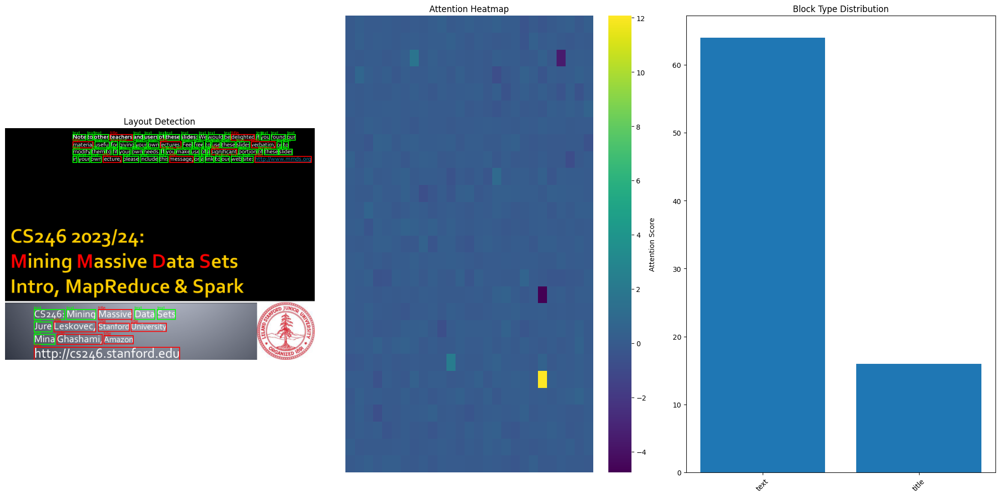

In [100]:
# Test
pdf_path = "/content/drive/MyDrive/lecture_notes/lecture_notes/data_mining/01-intro_mapReduce_Spark.pdf"
visualization = await visualize_layout_analysis(pdf_path)
plt.show()

In [101]:
async def visualize_multi_page_layout(pdf_path: str, start_page: int = 0, max_pages: int = 5):
    """Visualize layout analysis for multiple pages"""
    try:
        analyzer = LayoutAnalyzer()
        doc = fitz.open(pdf_path)
        total_pages = min(len(doc), start_page + max_pages)

        # Create figure grid based on number of pages
        pages_to_process = total_pages - start_page
        rows = (pages_to_process + 2) // 3  # 3 columns per row

        fig = plt.figure(figsize=(20, 7*rows))

        # Process each page
        for page_idx in range(start_page, total_pages):
            try:
                page = doc[page_idx]

                # Get page image
                pix = page.get_pixmap()
                img = Image.frombytes("RGB", [pix.width, pix.height], pix.samples)

                # Process layout
                results = await analyzer.process_page(page)
                visualizer = LayoutVisualizer(img.copy())

                # Calculate subplot position
                row_pos = (page_idx - start_page) // 3
                col_pos = (page_idx - start_page) % 3
                plot_pos = row_pos * 3 + col_pos + 1

                # Create subplot
                plt.subplot(rows, 3, plot_pos)

                # Draw bounding boxes
                bbox_image = visualizer.draw_bounding_boxes(results['blocks'])
                plt.imshow(bbox_image)
                plt.title(f'Page {page_idx + 1} Layout')
                plt.axis('off')

                # Add summary text
                classified_blocks = visualizer.classify_blocks(results['blocks'])
                summary_text = "\n".join([
                    f"{k}: {len(v)}" for k, v in classified_blocks.items() if len(v) > 0
                ])
                plt.text(1.02, 0.5, summary_text,
                        transform=plt.gca().transAxes,
                        verticalalignment='center',
                        fontsize=8)

            except Exception as e:
                logging.error(f"Error processing page {page_idx}: {e}")
                plt.text(0.5, 0.5, f'Page {page_idx + 1} Failed',
                        horizontalalignment='center',
                        verticalalignment='center')

        plt.tight_layout()
        return fig, {
            'total_pages': len(doc),
            'processed_pages': pages_to_process,
            'start_page': start_page
        }

    except Exception as e:
        logging.error(f"Multi-page visualization error: {e}")
        fig = plt.figure(figsize=(20, 10))
        plt.text(0.5, 0.5, f'Visualization Failed: {str(e)}',
                horizontalalignment='center',
                verticalalignment='center')
        return fig, {'error': str(e)}


In [102]:
async def analyze_document_structure(pdf_path: str):
    """Analyze overall document structure and provide statistics"""
    try:
        analyzer = LayoutAnalyzer()
        doc = fitz.open(pdf_path)

        document_stats = {
            'total_pages': len(doc),
            'page_stats': [],
            'overall_stats': defaultdict(int)
        }

        # Process each page
        for page_idx in tqdm(range(len(doc)), desc="Analyzing pages"):
            page = doc[page_idx]
            results = await analyzer.process_page(page)

            if "error" in results:
                logging.warning(f"Error on page {page_idx + 1}: {results['error']}")
                continue

            # Create blocks classification without image
            classified_blocks = LayoutVisualizer().classify_blocks(results['blocks'])

            # Collect page statistics
            page_stats = {
                'page_number': page_idx + 1,
                'block_counts': {k: len(v) for k, v in classified_blocks.items()}
            }
            document_stats['page_stats'].append(page_stats)

            # Update overall statistics
            for k, v in page_stats['block_counts'].items():
                document_stats['overall_stats'][k] += v

        return document_stats

    except Exception as e:
        logging.error(f"Document analysis error: {e}")
        return {
            'total_pages': 0,
            'page_stats': [],
            'overall_stats': defaultdict(int),
            'error': str(e)
        }

In [103]:
async def analyze_document(pdf_path: str):
    """Complete document analysis with visualizations and statistics"""
    try:
        print("Starting document analysis...")

        # Get document statistics
        stats = await analyze_document_structure(pdf_path)

        if 'error' in stats:
            print(f"Error during analysis: {stats['error']}")
            return stats

        print(f"\nDocument Analysis Summary:")
        print(f"Total Pages: {stats['total_pages']}")
        print("\nOverall Element Distribution:")
        for element_type, count in stats['overall_stats'].items():
            print(f"{element_type}: {count}")

        # Visualize pages in batches
        total_pages = stats['total_pages']
        batch_size = 6  # Show 6 pages at a time

        for start_page in range(0, total_pages, batch_size):
            print(f"\nVisualizing pages {start_page + 1} to {min(start_page + batch_size, total_pages)}...")
            fig, vis_stats = await visualize_multi_page_layout(
                pdf_path,
                start_page=start_page,
                max_pages=batch_size
            )
            plt.show()
            plt.close()

        return stats

    except Exception as e:
        logging.error(f"Analysis error: {e}")
        return {'error': str(e), 'total_pages': 0}

Starting document analysis...


Analyzing pages: 100%|██████████| 62/62 [01:28<00:00,  1.42s/it]



Document Analysis Summary:
Total Pages: 62

Overall Element Distribution:
text: 3816
title: 332
list: 211

Visualizing pages 1 to 6...


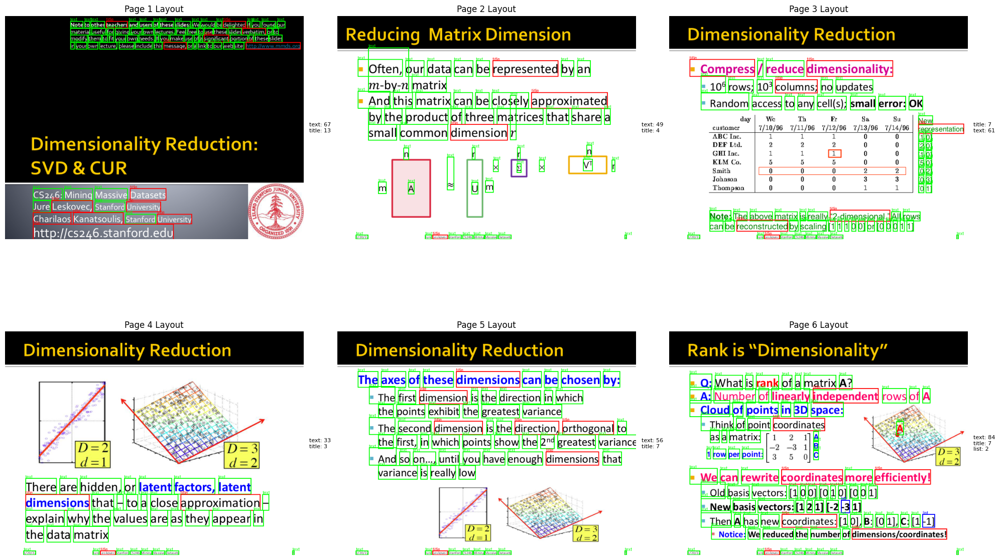


Visualizing pages 7 to 12...


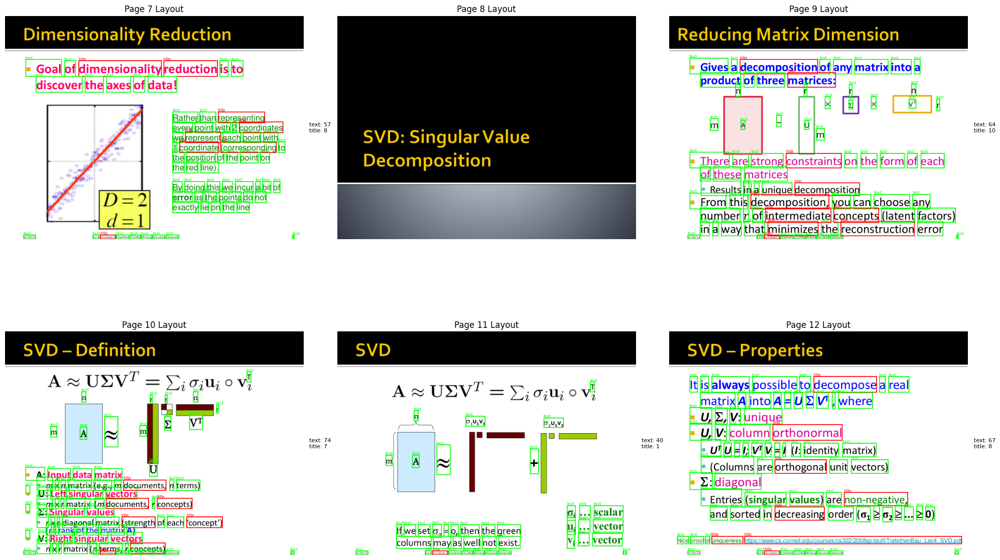


Visualizing pages 13 to 18...


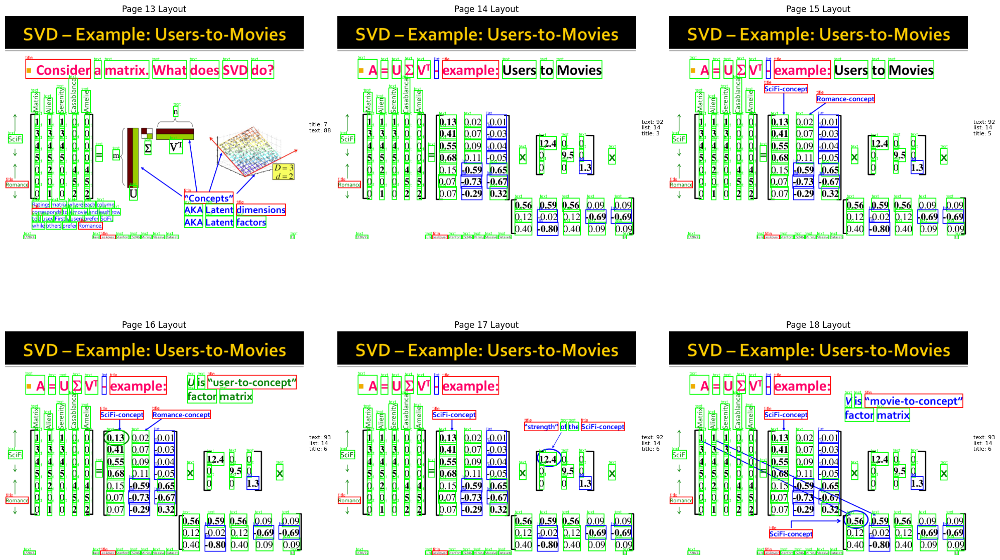


Visualizing pages 19 to 24...


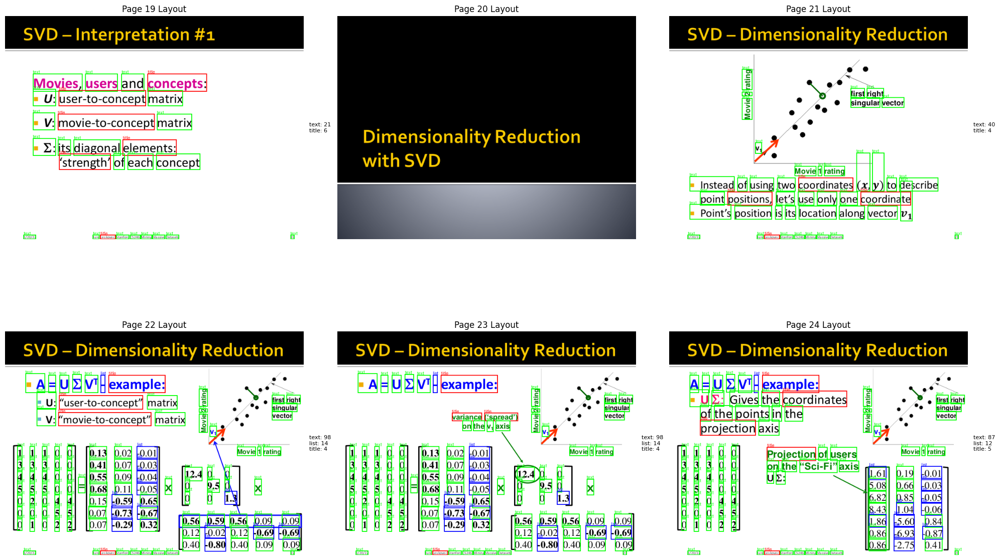


Visualizing pages 25 to 30...


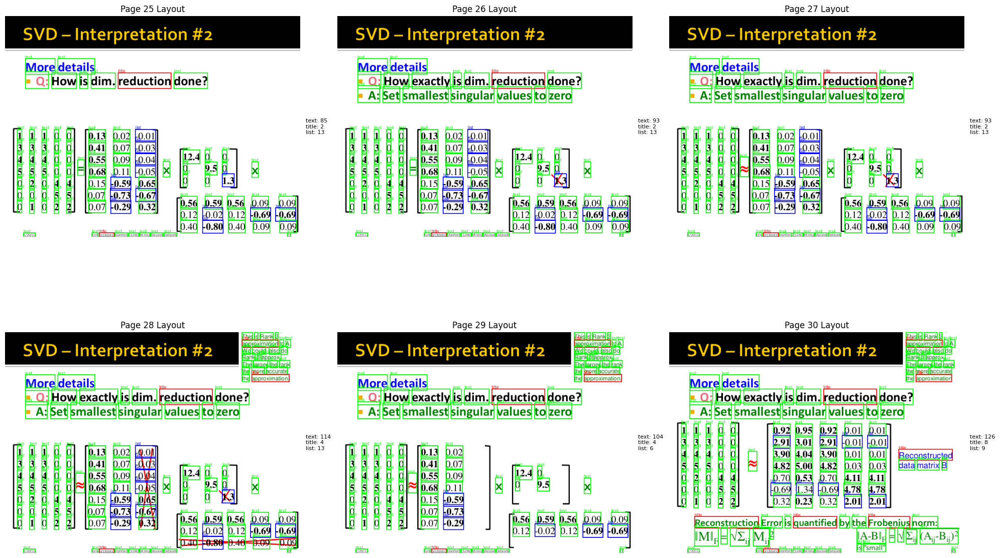


Visualizing pages 31 to 36...


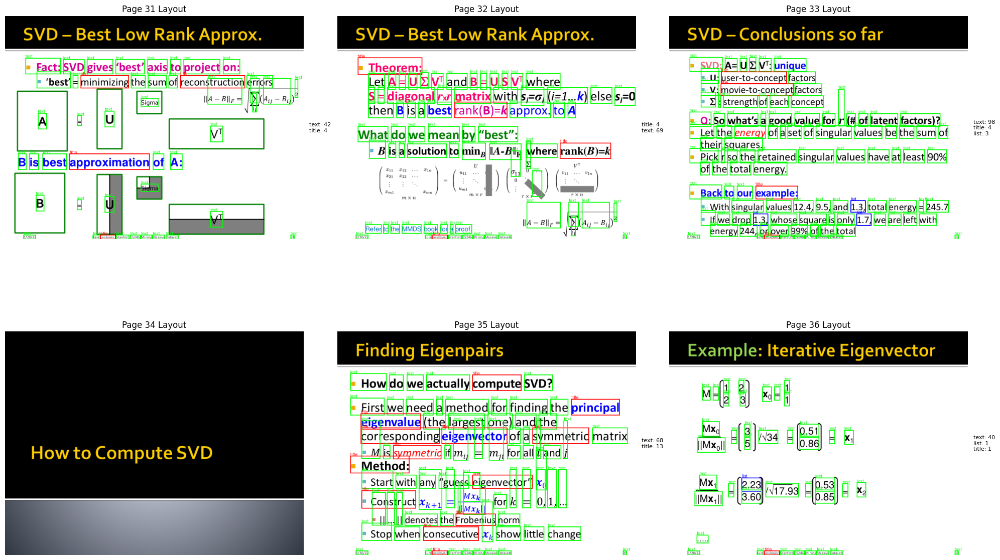


Visualizing pages 37 to 42...


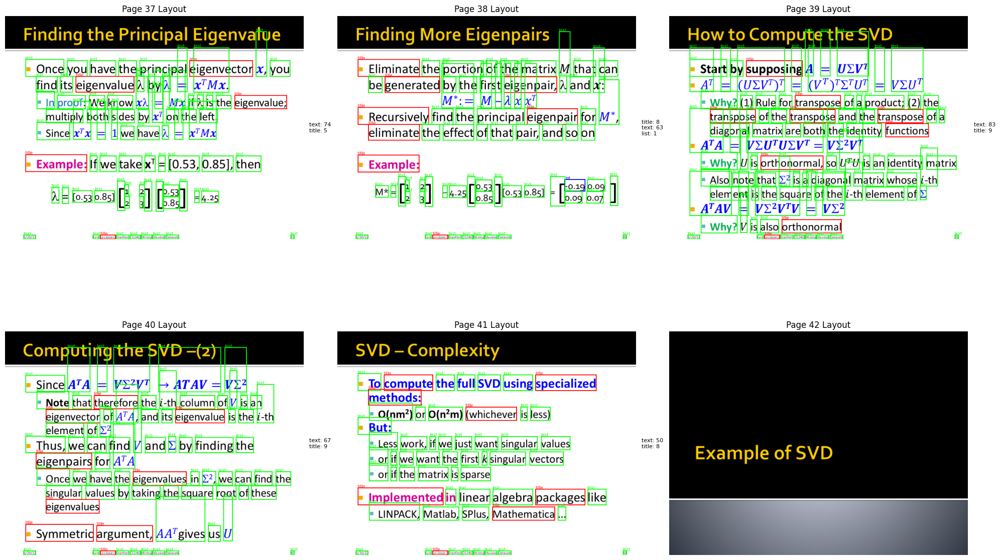


Visualizing pages 43 to 48...


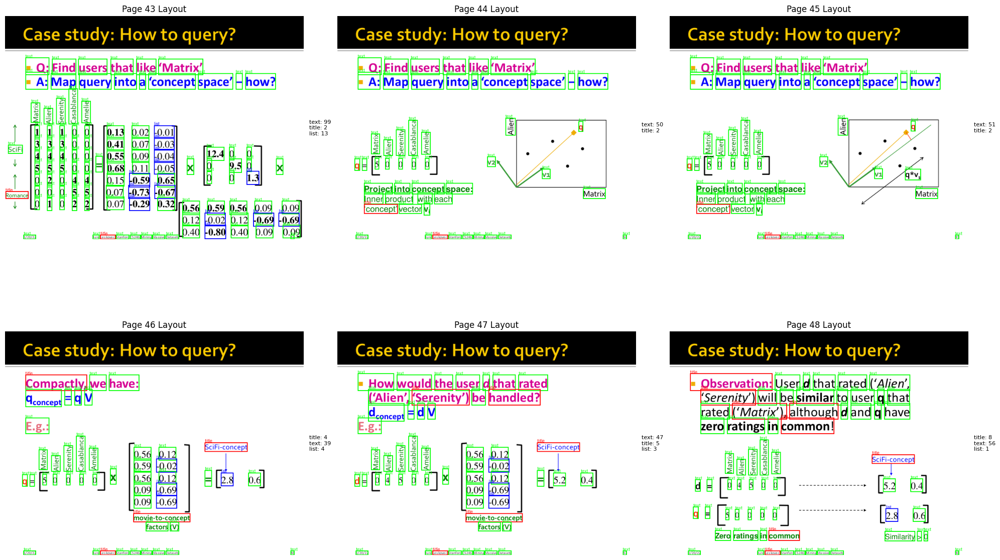


Visualizing pages 49 to 54...


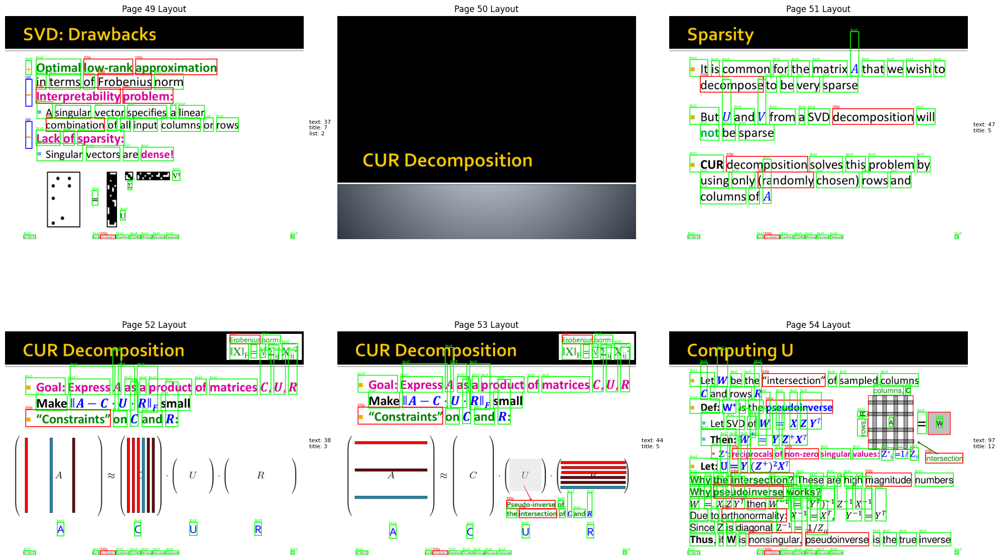


Visualizing pages 55 to 60...


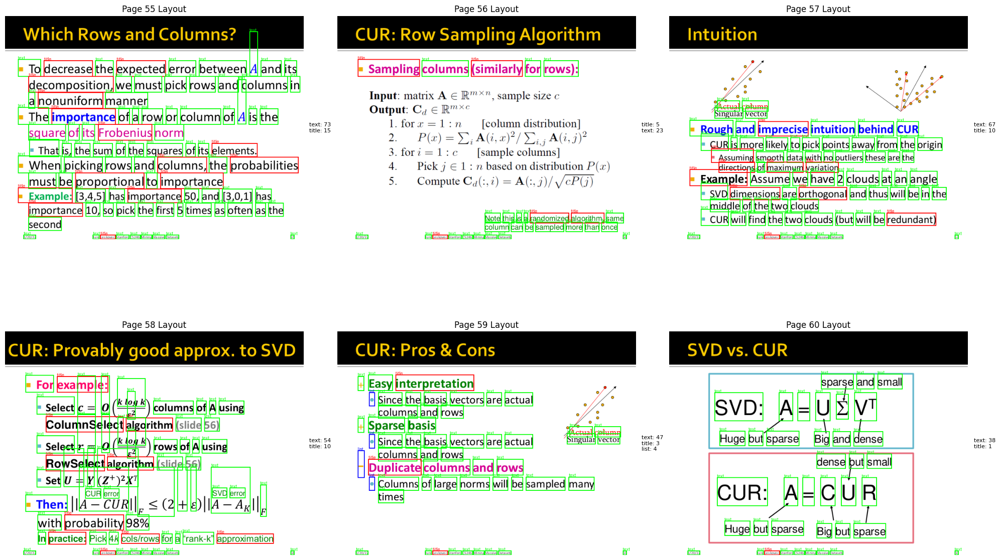


Visualizing pages 61 to 62...


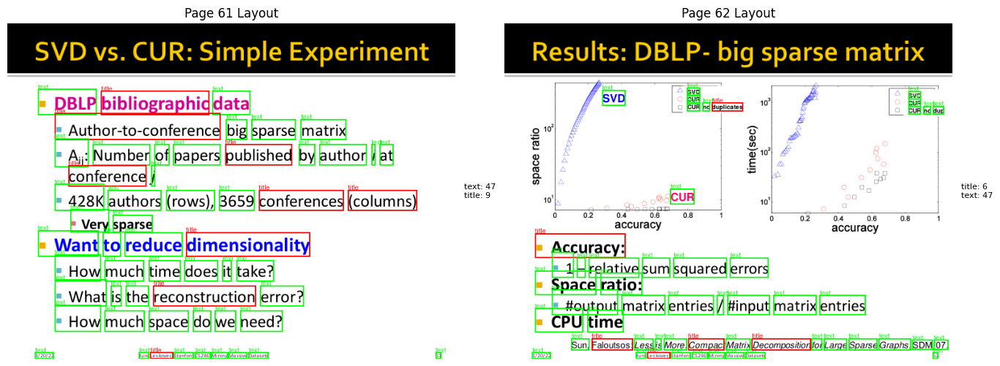


Processing completed successfully!
Total pages: 62

Element distribution:
text: 3816
title: 332
list: 211


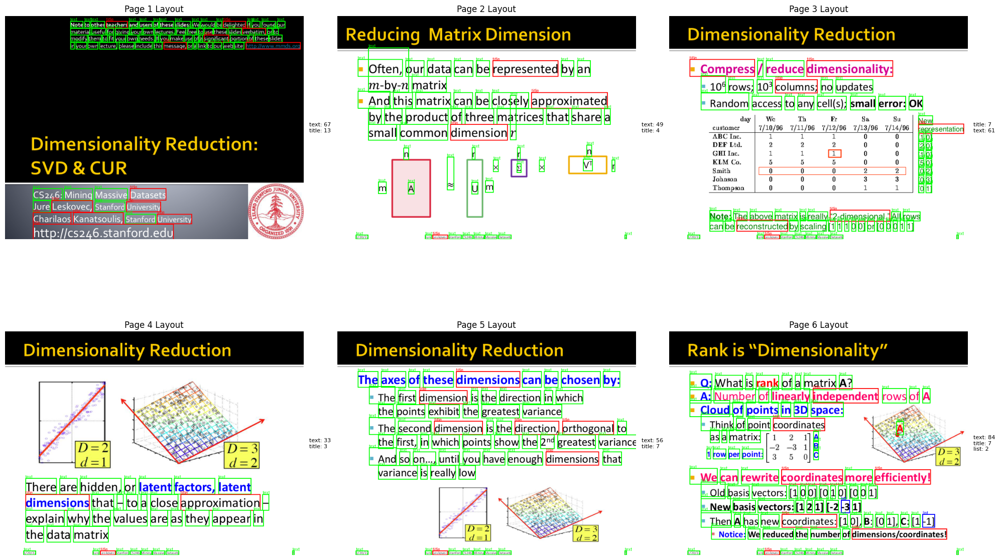

In [104]:
pdf_path = "/content/drive/MyDrive/lecture_notes/lecture_notes/data_mining/06-dim_red.pdf"
results = await analyze_document(pdf_path)
if 'error' not in results:
    print("\nProcessing completed successfully!")
    print(f"Total pages: {results['total_pages']}")
    print("\nElement distribution:")
    for element_type, count in results['overall_stats'].items():
        print(f"{element_type}: {count}")
else:
    print(f"Processing failed: {results['error']}")
start_page = 0
max_pages = 6
fig, stats = await visualize_multi_page_layout(pdf_path, start_page, max_pages)
plt.show()

## Knowledge Graph

In [23]:
%pip install pykeen

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.5/85.5 kB 8.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 718.4/718.4 kB 49.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 364.4/364.4 kB 30.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.5/233.5 kB 21.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 8.4 MB/s eta 0:00:00


In [52]:
import pykeen
from pykeen.pipeline import pipeline
from pykeen.triples import TriplesFactory
import torch
import traceback

In [ ]:
class EntityRegistry:
    def __init__(self):
        self.entity_to_id = {}
        self.id_to_entity = {}
        self.relation_to_id = {}
        self.id_to_relation = {}
        self.current_entity_id = 0
        self.current_relation_id = 0

    def get_or_register_entity(self, entity_text):
        if entity_text not in self.entity_to_id:
            self.entity_to_id[entity_text] = self.current_entity_id
            self.id_to_entity[self.current_entity_id] = entity_text
            self.current_entity_id += 1
        return self.entity_to_id[entity_text]

    def get_or_register_relation(self, relation_type):
        if relation_type not in self.relation_to_id:
            self.relation_to_id[relation_type] = self.current_relation_id
            self.id_to_relation[self.current_relation_id] = relation_type
            self.current_relation_id += 1
        return self.relation_to_id[relation_type]

In [105]:
class DocumentKGProcessor:
    def __init__(self):
        self.entity_registry = EntityRegistry()
        self.model = None

        # Define basic relation types
        self.relation_types = [
            'has_type',
            'above',
            'below',
            'left_of',
            'right_of',
            'contains',
            'next_to'
        ]

        # Register basic relations
        for rel in self.relation_types:
            self.entity_registry.get_or_register_relation(rel)

    def convert_layout_to_triples(self, layout_info):
        """Convert layout structure to KG triples with entity IDs"""
        triples = []
        registered_entities = set()

        try:
            #1st pass : Register all entities
            for block in layout_info['blocks']:
                if not block.get('text'):
                    continue

                entity_id = self.entity_registry.get_or_register_entity(block['text'])
                registered_entities.add(entity_id)

                block_type = block.get('type', 'text')
                type_id = self.entity_registry.get_or_register_entity(block_type)
                registered_entities.add(type_id)

            # Second pass: Create triples with registered IDs
            for block in layout_info['blocks']:
                if not block.get('text'):
                    continue

                text_id = self.entity_registry.get_or_register_entity(block['text'])
                block_type = block.get('type', 'text')
                type_id = self.entity_registry.get_or_register_entity(block_type)

                # Add type relation
                triples.append([
                    text_id,
                    self.entity_registry.get_or_register_relation('has_type'),
                    type_id
                ])

                # Add spatial relations
                if 'bbox' in block:
                    x1, y1, x2, y2 = block['bbox']
                    for other_block in layout_info['blocks']:
                        if not other_block.get('text'):
                            continue
                        if block != other_block:
                            other_id = self.entity_registry.get_or_register_entity(other_block['text'])

                            if y2 < other_block['bbox'][1]:
                                triples.append([
                                    text_id,
                                    self.entity_registry.get_or_register_relation('above'),
                                    other_id
                                ])
                            if x2 < other_block['bbox'][0]:
                                triples.append([
                                    text_id,
                                    self.entity_registry.get_or_register_relation('left_of'),
                                    other_id
                                ])

            print(f"Total entities registered: {len(registered_entities)}")
            print(f"Total relations registered: {len(self.entity_registry.relation_to_id)}")

            return torch.tensor(triples)  # Return as tensor

        except Exception as e:
            print(f"Error converting layout to triples: {str(e)}")
            return torch.tensor([])

    def train_kg_model(self, triples):
        """Train knowledge graph embeddings model using PyKEEN"""
        try:
            if len(triples) == 0:
                print("No triples to train on")
                return None

            # Convert triples to numpy for TriplesFactory
            triples_np = triples.numpy()

            # Create initial factory with all triples
            full_factory = TriplesFactory(
                mapped_triples=triples_np,
                entity_to_id=self.entity_registry.entity_to_id,
                relation_to_id=self.entity_registry.relation_to_id,
                create_inverse_triples=True,
            )

            print(f"Created TriplesFactory with {full_factory.num_entities} entities and {full_factory.num_relations} relations")

            # Split into training, testing, and validation sets
            training, testing, validation = full_factory.split([0.8, 0.1, 0.1], random_state=42)

            print(f"Split data into:")
            print(f"- Training triples: {training.num_triples}")
            print(f"- Testing triples: {testing.num_triples}")
            print(f"- Validation triples: {validation.num_triples}")

            # Run training pipeline
            result = pipeline(
                training=training,
                testing=testing,
                validation=validation,
                model='TransE',
                model_kwargs={
                    'embedding_dim': 64,
                    'entity_initializer': 'uniform',
                    'relation_initializer': 'uniform',
                },
                optimizer='adam',
                optimizer_kwargs={
                    'lr': 0.001,
                    'weight_decay': 0.0
                },
                training_kwargs={
                    'num_epochs': 50,
                    'batch_size': 512,
                },
                stopper='early',
                stopper_kwargs={
                    'frequency': 5,
                    'patience': 2,
                    'relative_delta': 0.002
                },
                evaluator_kwargs={
                    'batch_size': 4096
                },
                device='cuda' if torch.cuda.is_available() else 'cpu',
                random_seed=42
            )

            print("\nTraining completed!")

            # Get all available metrics
            metrics_dict = {}

            # Access metrics results
            if hasattr(result, 'metric_results'):
                print("\nEvaluation Metrics:")
                metrics = result.metric_results


                print("\nAvailable metrics:")
                for metric_name in dir(metrics):
                    if not metric_name.startswith('_'):  # Skip private attributes
                        try:
                            value = getattr(metrics, metric_name)
                            if isinstance(value, (float, int, np.ndarray, torch.Tensor)):
                                print(f"{metric_name}: {value}")
                                metrics_dict[metric_name] = float(value)
                        except Exception as e:
                            continue

            # Access losses if available
            if hasattr(result, 'losses'):
                losses = result.losses
                if len(losses) > 0:
                    print("\nTraining Losses:")
                    print(f"Initial loss: {losses[0]}")
                    print(f"Final loss: {losses[-1]}")
                    metrics_dict['initial_loss'] = float(losses[0])
                    metrics_dict['final_loss'] = float(losses[-1])

            # Store model
            self.model = result.model
            return metrics_dict

        except Exception as e:
            print(f"Error training KG model: {str(e)}")
            print("Stack trace:", traceback.format_exc())
            return None

    def get_entity_embedding(self, entity_text):
        """Get embedding for a specific entity"""
        if self.model is None:
            return None
        try:
            if entity_text not in self.entity_registry.entity_to_id:
                return None
            entity_id = self.entity_registry.entity_to_id[entity_text]

            # Get the device from the model's parameters
            device = next(self.model.parameters()).device

            entity_tensor = torch.tensor([entity_id], device=device)
            embedding = self.model.entity_representations[0](entity_tensor).detach().cpu().numpy()
            return embedding
        except Exception as e:
            print(f"Error getting entity embedding: {str(e)}")
            return None

    def get_most_similar_entities(self, entity_text, top_k=5):
        """Find most similar entities to the given entity"""
        if self.model is None or entity_text not in self.entity_registry.entity_to_id:
            return []
        try:
            # Get the device from the model's parameters
            device = next(self.model.parameters()).device

            # Get query embedding
            query_id = self.entity_registry.entity_to_id[entity_text]
            query_tensor = torch.tensor([query_id], device=device)
            query_embedding = self.model.entity_representations[0](query_tensor).detach()

            # Get all entity embeddings
            all_ids = torch.arange(len(self.entity_registry.entity_to_id), device=device)
            all_embeddings = self.model.entity_representations[0](all_ids).detach()

            # Calculate similarities
            similarities = torch.nn.functional.cosine_similarity(
                query_embedding,
                all_embeddings
            )

            # Get top-k similar entities
            top_k_values, top_k_indices = torch.topk(similarities, k=min(top_k+1, len(all_ids)))
            top_k_values = top_k_values.cpu()
            top_k_indices = top_k_indices.cpu()

            results = []
            for i in range(1, len(top_k_indices)):  # Skip first one (self)
                idx = top_k_indices[i].item()
                score = top_k_values[i].item()
                entity_text = self.entity_registry.id_to_entity[idx]
                results.append((entity_text, score))

            return results

        except Exception as e:
            print(f"Error finding similar entities: {str(e)}")
            return []

In [106]:
async def process_document(pdf_path):
    """Process a PDF document to create and train a knowledge graph model"""
    try:
        # Initialize components
        layout_analyzer = LayoutAnalyzer()
        kg_processor = DocumentKGProcessor()

        # Open the PDF file
        doc = fitz.open(pdf_path)

        all_triples = []
        valid_pages = 0

        # Process all pages
        print(f"Processing {len(doc)} pages...")
        for page_num in range(len(doc)):
            try:
                page = doc[page_num]
                layout_info = await layout_analyzer.process_page(page)

                # Convert layout to triples
                page_triples = kg_processor.convert_layout_to_triples(layout_info)

                # Only add if we got valid triples
                if page_triples.shape[0] > 0:
                    all_triples.append(page_triples)
                    valid_pages += 1

            except Exception as e:
                print(f"Error processing page {page_num}: {str(e)}")
                continue

        # Combine all triples if we have any
        if all_triples:
            print(f"\nSuccessfully processed {valid_pages} pages")
            print(f"Combining triples from all pages...")

            # Concatenate all triples tensors
            combined_triples = torch.cat(all_triples, dim=0)

            print(f"Total triples gathered: {combined_triples.shape[0]}")
            print(f"Training knowledge graph model...")

            # Train the model
            metrics = kg_processor.train_kg_model(combined_triples)

            if metrics:
                print("\nTraining completed successfully")
                print("Training metrics:", metrics)
            else:
                print("\nWarning: Training completed but no metrics were returned")
        else:
            print("No valid triples were extracted from the document")

        # Close the document
        doc.close()

        return kg_processor

    except Exception as e:
        print(f"Error processing document: {str(e)}")
        return None

In [107]:
pdf_path = "/content/drive/MyDrive/lecture_notes/lecture_notes/data_mining/06-dim_red.pdf"
kg_processor = await process_document(pdf_path)

Processing 62 pages...
Total entities registered: 61
Total relations registered: 7
Total entities registered: 45
Total relations registered: 7
Total entities registered: 55
Total relations registered: 7
Total entities registered: 33
Total relations registered: 7
Total entities registered: 48
Total relations registered: 7
Total entities registered: 72
Total relations registered: 7
Total entities registered: 52
Total relations registered: 7
Total entities registered: 0
Total relations registered: 7
Total entities registered: 59
Total relations registered: 7
Total entities registered: 54
Total relations registered: 7
Total entities registered: 39
Total relations registered: 7
Total entities registered: 66
Total relations registered: 7
Total entities registered: 59
Total relations registered: 7
Total entities registered: 63
Total relations registered: 7
Total entities registered: 65
Total relations registered: 7
Total entities registered: 66
Total relations registered: 7
Total entities reg

Training epochs on cuda:0:   0%|          | 0/50 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/1013 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/32.4k [00:00<?, ?triple/s]


Training completed!

Evaluation Metrics:

Available metrics:

Training Losses:
Initial loss: 0.5472086429713626
Final loss: 0.13846296783966938

Training completed successfully
Training metrics: {'initial_loss': 0.5472086429713626, 'final_loss': 0.13846296783966938}


## Test Knowledge Graph

In [108]:
if kg_processor and kg_processor.model:
    # Test the model
    test_text = "dimensionality"
    similar = kg_processor.get_most_similar_entities(test_text)
    print(f"\nSimilar entities to '{test_text}':")
    for entity, score in similar:
        print(f"- {entity}: {score:.3f}")


Similar entities to 'dimensionality':
- every: 0.653
- represent: 0.639
- Rather: 0.630
- reduce: 0.617
- data!: 0.579


```
Similar entities to 'dimensionality':
- every: 0.653
- represent: 0.639
- Rather: 0.630
- reduce: 0.617
- data!: 0.579
```

In [109]:
if kg_processor and kg_processor.model:
    # Test the model
    test_text = "can you descibe the relational database?"
    similar = kg_processor.get_most_similar_entities(test_text)
    print(f"\nSimilar entities to '{test_text}':")
    for entity, score in similar:
        print(f"- {entity}: {score:.3f}")


Similar entities to 'can you descibe the relational database?':


In [123]:
if kg_processor and kg_processor.model:
    # Test the model
    test_text = "concept"
    similar = kg_processor.get_most_similar_entities(test_text)
    print(f"\nSimilar entities to '{test_text}':")
    for entity, score in similar:
        print(f"- {entity}: {score:.3f}")


Similar entities to 'concept':
- their: 0.588
- factors: 0.572
- 1.3,: 0.563
- 245.7: 0.546
- Project: 0.542


## Knowledge Graph Visualization

In [92]:
%pip install networkx pyvis

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 756.0/756.0 kB 47.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 73.3 MB/s eta 0:00:00


In [93]:
import networkx as nx

from pyvis.network import Network

import matplotlib.pyplot as plt

import torch

# Check the installations

print(f"NetworkX version: {nx.__version__}")

print(f"Pyvis installed successfully!")

NetworkX version: 3.4.2
Pyvis installed successfully!


In [94]:
import networkx as nx
from pyvis.network import Network
import matplotlib.pyplot as plt
import random
from typing import Dict, List, Set, Tuple

class KnowledgeGraphVisualizer:
    def __init__(self, entity_registry, model):
        self.entity_registry = entity_registry
        self.model = model
        self.G = nx.Graph()

    def create_graph(self, similarity_threshold: float = 0.5, max_edges_per_node: int = 5) -> nx.Graph:
        """Create a NetworkX graph from the knowledge graph embeddings"""
        # Get all entities
        entities = list(self.entity_registry.entity_to_id.keys())
        device = next(self.model.parameters()).device

        # Add nodes
        for entity in entities:
            self.G.add_node(entity)

        # Add edges based on similarity
        for i, entity1 in enumerate(entities):
            entity1_id = self.entity_registry.entity_to_id[entity1]
            entity1_tensor = torch.tensor([entity1_id], device=device)
            embedding1 = self.model.entity_representations[0](entity1_tensor).detach()

            # Get similarities with all other entities
            similarities = []
            for entity2 in entities[i+1:]:
                entity2_id = self.entity_registry.entity_to_id[entity2]
                entity2_tensor = torch.tensor([entity2_id], device=device)
                embedding2 = self.model.entity_representations[0](entity2_tensor).detach()

                similarity = torch.nn.functional.cosine_similarity(embedding1, embedding2).item()
                if similarity > similarity_threshold:
                    similarities.append((entity2, similarity))

            # Add top edges
            top_similarities = sorted(similarities, key=lambda x: x[1], reverse=True)[:max_edges_per_node]
            for entity2, similarity in top_similarities:
                self.G.add_edge(entity1, entity2, weight=similarity)

        return self.G

    def save_interactive_visualization(self, output_file: str = "knowledge_graph.html",
                                    similarity_threshold: float = 0.5,
                                    max_edges_per_node: int = 5):
        """Create and save an interactive HTML visualization"""
        # Create graph if not already created
        if len(self.G.edges()) == 0:
            self.create_graph(similarity_threshold, max_edges_per_node)

        # Create Pyvis network
        net = Network(notebook=True, height="750px", width="100%")

        # Add nodes and edges
        for node in self.G.nodes():
            net.add_node(node, label=node)

        for edge in self.G.edges(data=True):
            source, target, data = edge
            weight = data.get('weight', 0.5)
            # Scale width based on weight
            width = weight * 5
            net.add_edge(source, target, value=width, title=f"Similarity: {weight:.3f}")

        # Set physics layout
        net.toggle_physics(True)
        net.show_buttons(filter_=['physics'])

        # Save
        net.save_graph(output_file)
        return output_file

    def plot_static_visualization(self, figsize: Tuple[int, int] = (15, 15)) -> plt.Figure:
        """Create a static matplotlib visualization"""
        if len(self.G.edges()) == 0:
            self.create_graph()

        plt.figure(figsize=figsize)

        # Calculate node sizes based on degree
        node_degrees = dict(self.G.degree())
        node_sizes = [v * 100 for v in node_degrees.values()]

        # Calculate edge weights for width
        edge_weights = [self.G[u][v]['weight'] * 2 for u, v in self.G.edges()]

        # Create layout
        pos = nx.spring_layout(self.G)

        # Draw the graph
        nx.draw_networkx_nodes(self.G, pos, node_size=node_sizes, node_color='lightblue')
        nx.draw_networkx_edges(self.G, pos, width=edge_weights, alpha=0.5)
        nx.draw_networkx_labels(self.G, pos, font_size=8)

        plt.title("Knowledge Graph Visualization")
        plt.axis('off')

        return plt.gcf()

    def get_graph_statistics(self) -> Dict:
        """Calculate and return graph statistics"""
        if len(self.G.edges()) == 0:
            self.create_graph()

        stats = {
            'num_nodes': self.G.number_of_nodes(),
            'num_edges': self.G.number_of_edges(),
            'avg_degree': sum(dict(self.G.degree()).values()) / self.G.number_of_nodes(),
            'density': nx.density(self.G),
            'num_connected_components': nx.number_connected_components(self.G),
            'avg_clustering_coefficient': nx.average_clustering(self.G)
        }

        return stats

<ipython-input-95-9880310d75d3>:13: UserWarning: Glyph 61601 (\uf0a1) missing from current font.
  plt.savefig('graph_viz_1.png', dpi=300, bbox_inches='tight')
<ipython-input-95-9880310d75d3>:13: UserWarning: Glyph 119898 (\N{MATHEMATICAL ITALIC SMALL M}) missing from current font.
  plt.savefig('graph_viz_1.png', dpi=300, bbox_inches='tight')
<ipython-input-95-9880310d75d3>:13: UserWarning: Glyph 119899 (\N{MATHEMATICAL ITALIC SMALL N}) missing from current font.
  plt.savefig('graph_viz_1.png', dpi=300, bbox_inches='tight')
<ipython-input-95-9880310d75d3>:13: UserWarning: Glyph 119903 (\N{MATHEMATICAL ITALIC SMALL R}) missing from current font.
  plt.savefig('graph_viz_1.png', dpi=300, bbox_inches='tight')
<ipython-input-95-9880310d75d3>:13: UserWarning: Glyph 61620 (\uf0b4) missing from current font.
  plt.savefig('graph_viz_1.png', dpi=300, bbox_inches='tight')
<ipython-input-95-9880310d75d3>:13: UserWarning: Glyph 61523 (\uf053) missing from current font.
  plt.savefig('graph_viz_


Graph Statistics:
num_nodes: 1105.000
num_edges: 2658.000
avg_degree: 4.811
density: 0.004
num_connected_components: 64.000
avg_clustering_coefficient: 0.323


/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 61601 (\uf0a1) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 119898 (\N{MATHEMATICAL ITALIC SMALL M}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 119899 (\N{MATHEMATICAL ITALIC SMALL N}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 119903 (\N{MATHEMATICAL ITALIC SMALL R}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 61620 (\uf0b4) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython

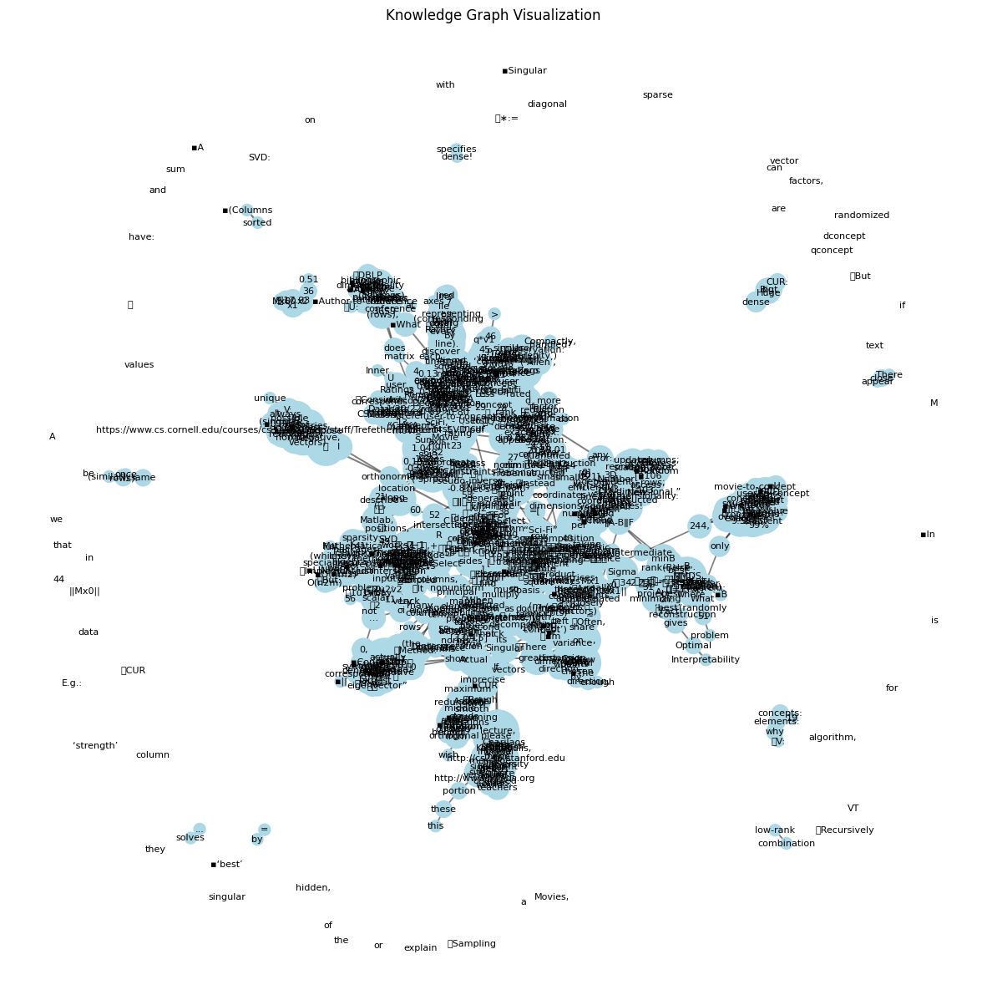

In [95]:

visualizer = KnowledgeGraphVisualizer(kg_processor.entity_registry, kg_processor.model)

html_file = visualizer.save_interactive_visualization(
    output_file="knowledge_graph.html",
    similarity_threshold=0.6,  # Only show edges with similarity > 0.6
    max_edges_per_node=3      # Limit number of edges per node
)

# Create static visualization
fig = visualizer.plot_static_visualization()
plt.savefig('graph_viz_1.png', dpi=300, bbox_inches='tight')

# Get graph statistics
stats = visualizer.get_graph_statistics()
print("\nGraph Statistics:")
for key, value in stats.items():
    print(f"{key}: {value:.3f}")